In [14]:
import os
from google.colab import drive
import yaml
import torch
from IPython.display import Image, clear_output
import glob
import pandas as pd
from pathlib import Path
import logging


In [12]:
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

In [2]:
drive.mount('/content/drive')
project_dir = '/content/drive/MyDrive/ARI3129_garbage_detection'

Mounted at /content/drive


In [19]:
def update_data_yaml(yaml_path: str, base_dir: str) -> None:
    try:
        with open(yaml_path, 'r') as f:
            data = yaml.safe_load(f)

        # Update paths to absolute paths
        data['train'] = str(Path(base_dir) / 'train' / 'images')
        data['val'] = str(Path(base_dir) / 'valid' / 'images')
        data['test'] = str(Path(base_dir) / 'test' / 'images')

        with open(yaml_path, 'w') as f:
            yaml.dump(data, f, default_flow_style=False, sort_keys=False)

        logger.info("Successfully updated data.yaml paths")
    except Exception as e:
        logger.error(f"Error updating data.yaml: {str(e)}")
        raise

In [24]:
def train_model(
    data_yaml_path: str,
    img_size: int = 640,
    batch_size: int = 60,
    epochs: int = 150,
    weights: str = 'yolov5s.pt',
    cache: bool = True
) -> str:
    try:
        import train

        # Prepare training arguments
        train_args = {
            'data': data_yaml_path,
            'epochs': epochs,
            'batch_size': batch_size,
            'imgsz': img_size,
            'weights': weights,
            'device': 0,
            'cache': cache
        }

        # Start training
        logger.info("Starting model training...")
        results = train.run(**train_args)

        # Get path to best weights
        best_weights = str(Path('runs/train/exp/weights/best.pt'))
        logger.info(f"Training completed. Best weights saved at: {best_weights}")

        return best_weights

    except Exception as e:
        logger.error(f"Error during training: {str(e)}")
        raise


In [29]:
def evaluate_model(
    weights_path: str,
    data_yaml_path: str,
    img_size: int = 640
) -> None:
    try:
        import val  # Import YOLOv5 validation module

        # Run validation
        logger.info("Starting model evaluation...")
        val.run(
            weights=weights_path,
            data=data_yaml_path,
            task='test',
            imgsz=img_size,
            save_json=True,
            save_txt=True
        )

    except Exception as e:
        logger.error(f"Error during evaluation: {str(e)}")
        raise

In [27]:
def detect_on_images(
    weights_path: str,
    source_path: str,
    data_yaml_path: str,
    img_size: int = 640
) -> None:
    try:
        import detect  # Import YOLOv5 detect module

        # Run detection
        logger.info("Running detection on test images...")
        detect.run(
            weights=weights_path,
            source=source_path,
            data=data_yaml_path,
            imgsz=(img_size, img_size)
        )

        # Display results
        from glob import glob
        for image_path in glob('runs/detect/exp/*.jpg'):
            display(Image(filename=image_path))
            print("\n")

    except Exception as e:
        logger.error(f"Error during detection: {str(e)}")
        raise

In [20]:
dataset_dir = os.path.join(project_dir, 'Garbage-Detection-4')
yaml_path = os.path.join(dataset_dir, 'data.yaml')
update_data_yaml(yaml_path, dataset_dir)

In [22]:
%cd yolov5

/content/drive/MyDrive/ARI3129_garbage_detection/yolov5


In [25]:
# Train the model
best_weights = train_model(
    data_yaml_path=yaml_path,
    img_size=640,
    batch_size=60,
    epochs=200
)

train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/ARI3129_garbage_detection/Garbage-Detection-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=60, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=True, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_

In [30]:
# Evaluate the model
evaluate_model(
    weights_path=best_weights,
    data_yaml_path=yaml_path
)

YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/drive/MyDrive/ARI3129_garbage_detection/Garbage-Detection-4/test/labels... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<00:00, 83.58it/s]
test: New cache created: /content/drive/MyDrive/ARI3129_garbage_detection/Garbage-Detection-4/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 1/1 [00:03<00:00,  3.56s/it]
                   all         30         91      0.665      0.721      0.727      0.496
           Mixed Waste         30         16      0.773      0.812      0.828      0.599
         Organic Waste         30         39      0.862      0.799      0.884      0.615
           Other Waste         30         17      0.364      0.271      0.257      0.121
   Recyclable Material         3

loading annotations into memory...


YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/30 /content/drive/MyDrive/ARI3129_garbage_detection/Garbage-Detection-4/test/images/IMG_20250106_072531_jpg.rf.63f6f1281a5794502a4462f37a7d5722.jpg: 640x640 2 Organic Wastes, 11.6ms
image 2/30 /content/drive/MyDrive/ARI3129_garbage_detection/Garbage-Detection-4/test/images/IMG_20250106_072634_jpg.rf.c850b16f45fe8b0cc9ca47c9a551eb7a.jpg: 640x640 1 Organic Waste, 11.6ms
image 3/30 /content/drive/MyDrive/ARI3129_garbage_detection/Garbage-Detection-4/test/images/IMG_20250106_072930_jpg.rf.64ddfc87bf9ac9b37caf98faac04033c.jpg: 640x640 1 Organic Waste, 1 Other Waste, 11.7ms
image 4/30 /content/drive/MyDrive/ARI3129_garbage_detection/Garbage-Detection-4/test/images/IMG_4199_JPG.rf.9d4776b71859b05d3b116a4219ed71ac.jpg: 640x640 2 Recyclable Materials, 11.6ms
image 5/30 /content/drive/MyDrive/ARI3129_garbage_de

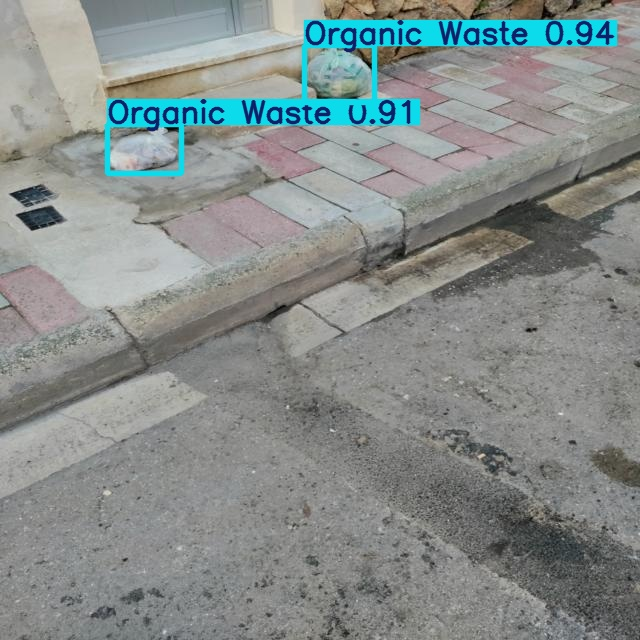

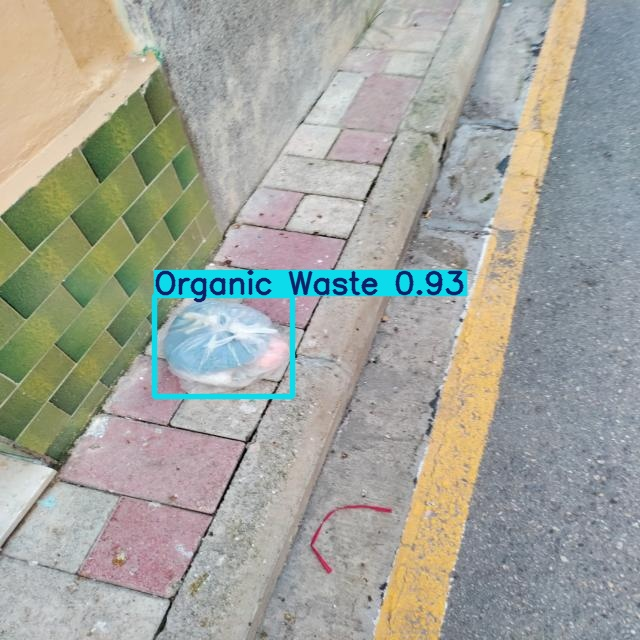

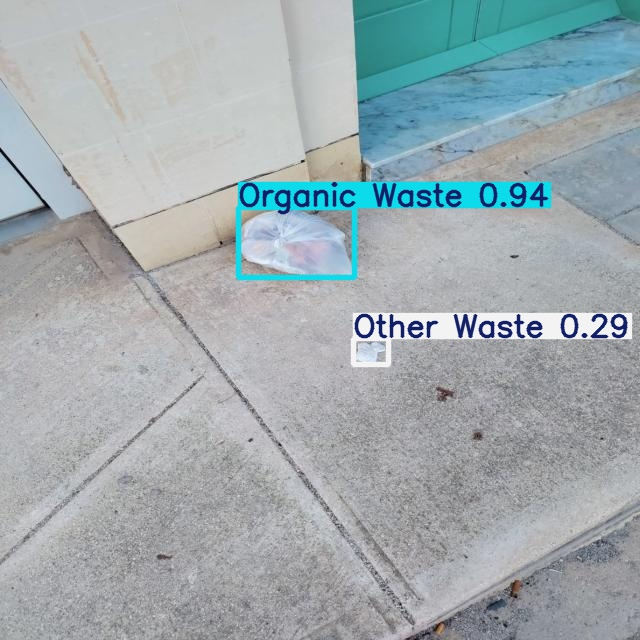

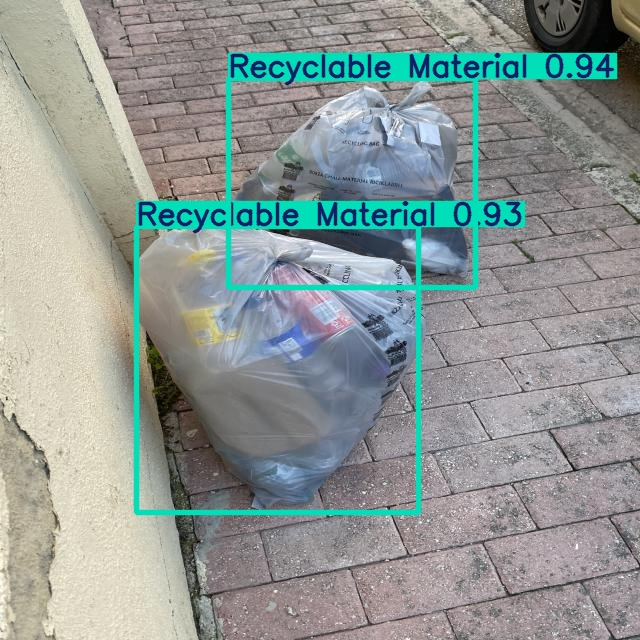

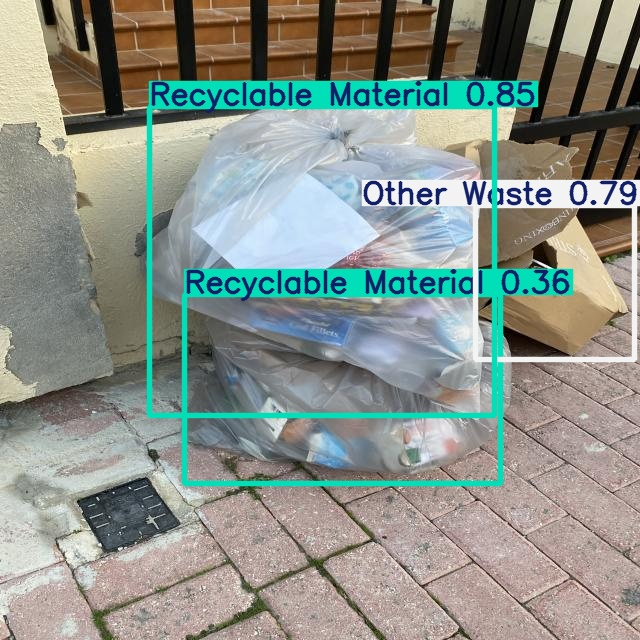

...

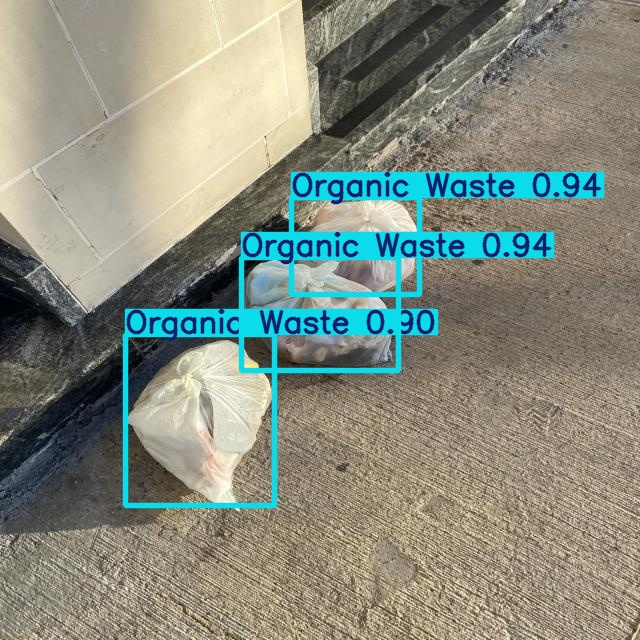

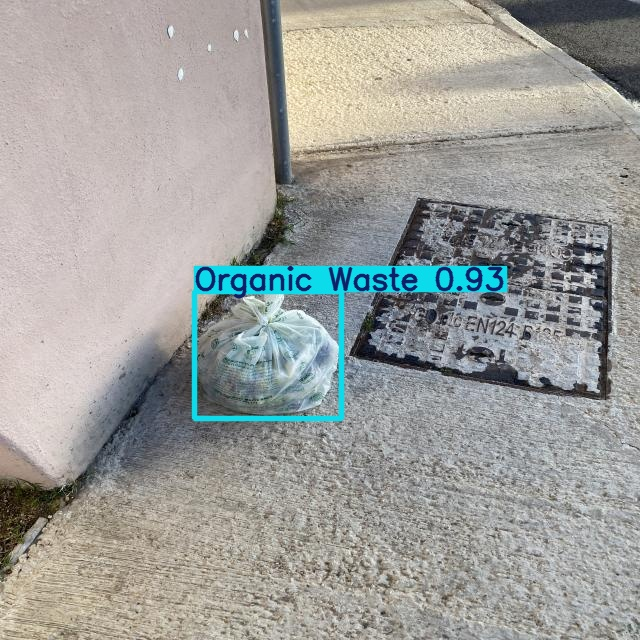

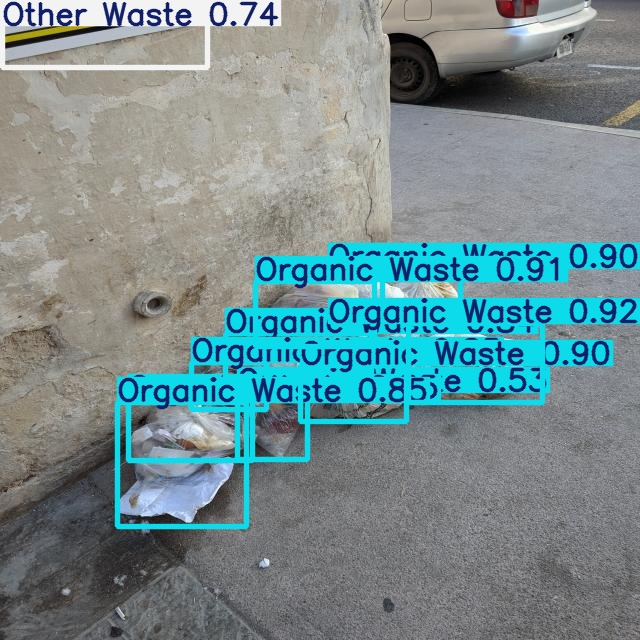

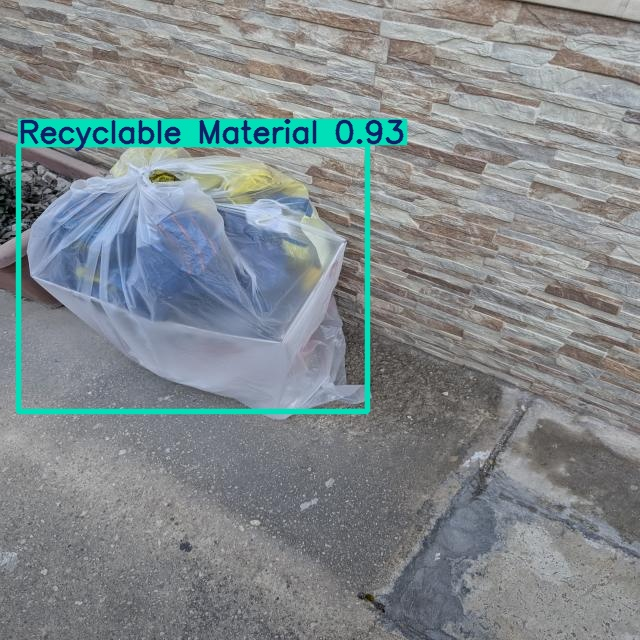

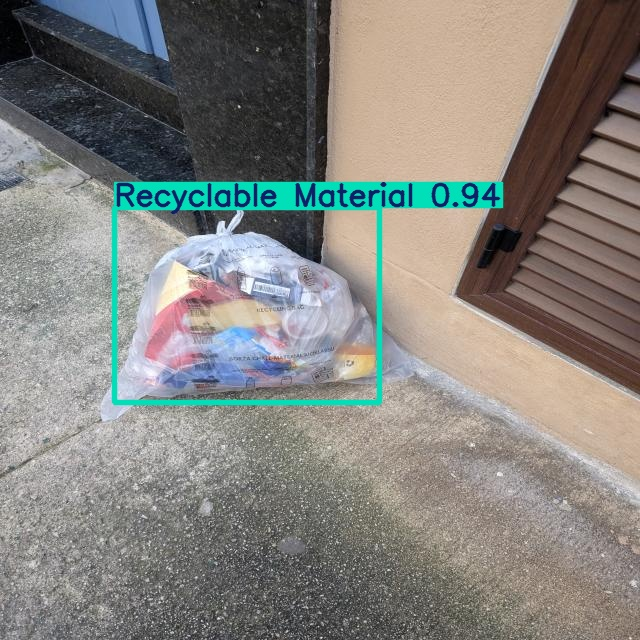

In [31]:
# Run detection on test images
test_images_path = os.path.join(dataset_dir, 'test/images')
detect_on_images(
    weights_path=best_weights,
    source_path=test_images_path,
    data_yaml_path=yaml_path
)

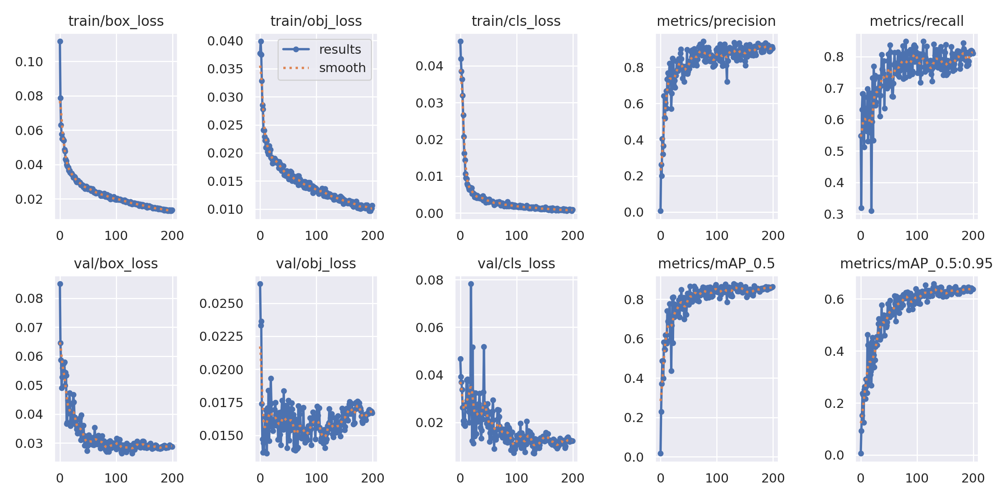

In [32]:
from utils.plots import plot_results
Image(filename=f'runs/train/exp/results.png', width=1000)

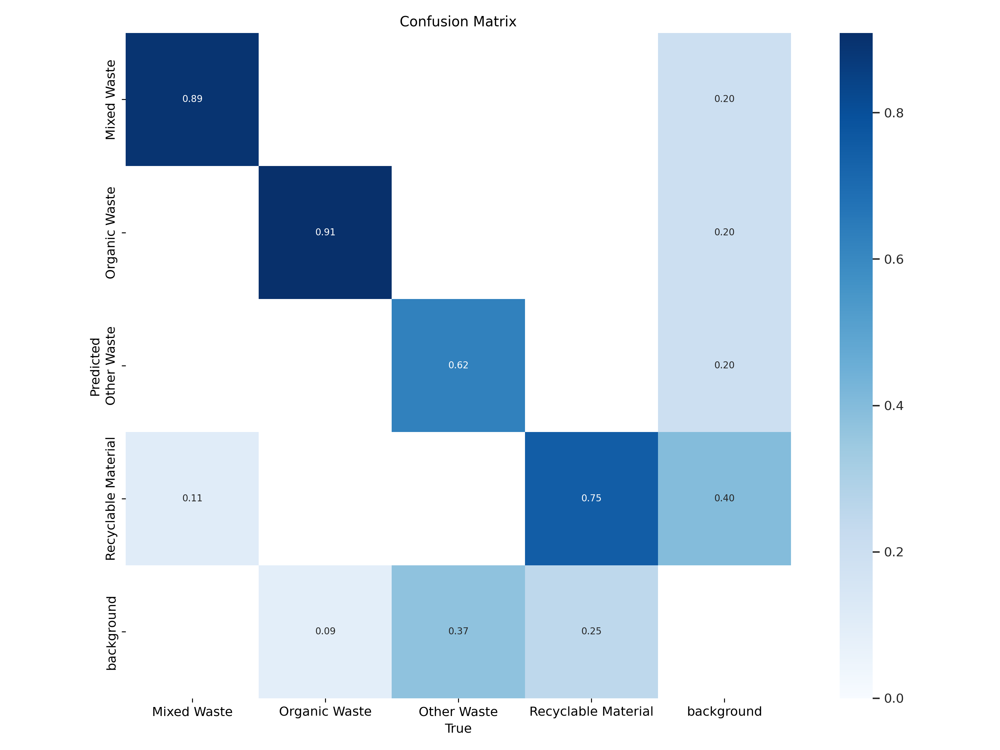

In [40]:
Image(filename=f'runs/train/exp/confusion_matrix.png', width=900)

In [39]:
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>